## Project Description

#### Introduction
The increasing availability of high-resolution satellite imagery and open-source mapping efforts has opened new possibilities for automated analysis of urban environments; specific building characteristics such as roof materials remain underexplored in open geospatial datasets and AI applications. Roof material information represents a critical gap in our understanding of urban landscapes, with significant implications across multiple domains, including renewable energy planning, urban heat mitigation, disaster resilience, and heritage conservation.

**This study aims to develop two ready-to-use, AI-ready open datasets containing both building roof types and geometry, along with a scalable pipeline for roof material classification.** The datasets are created using OpenStreetMap (OSM) roof material labels and high-resolution satellite imagery obtained from [OpenAerialMap](https://map.openaerialmap.org/#/7.164459228515626,50.84562199133437,12/square/12020303222/617970f8800b10000509eda7?_k=h73n1n), originally from the Maxar [Open Data Program](https://www.maxar.com/open-data), leveraging OSM building outlines to avoid computationally expensive segmentation processes. This notebook includes the code to obtain and preprocess this data, which can be used to transform any geospatial dataset into the YOLO dataset format, as well as to train a model. In this notebook, we work with roof material data; however, we also provide instructions on how to easily retrofit this notebook to work with roof shape data.

To demonstrate the dataset’s applicability, a convolutional neural network (CNN) model, specifically, Ultralytics' YOLOv11, is used to classify roofs into categories such as roof tiles, tar paper, and metal, followed by an evaluation of the model’s performance and an example of inference.

#### Theory of Impact
Knowing both the material and shape of roofs has many potential use cases. For example, solar energy plays a crucial role in reducing greenhouse gas emissions and meeting rising energy demands. Information on building roof types and geometry is crucial for evaluating solar potential, enhancing energy efficiency, and supporting energy transition policies. Roof material and shape data can also inform studies on thermal efficiency, roof durability, disaster risk, heritage conservation, urban heat, and more. **A detailed and extensive list of other potential impacts and uses cases of this submission can be found in the conclusion.**

Despite these valuable applications, automated roof material classification from remote sensing data remains challenging due to limited training data availability and the visual similarity between certain roof materials.

#### Novelty
Our work addresses several gaps in existing approaches:
- Dataset: While general land cover classification datasets exist, they typically lack the granularity needed for specific roof material identification. Our dataset specifically addresses this gap by combining high-resolution satellite imagery with volunteered geographic information (VGI) from OpenStreetMap. We build upon [previous work](https://arxiv.org/abs/2406.04949) in classifying roof material (Guthula et al., 2024), which relies on expensive drone imagery and new manual labeling. 
- Methodological Distinction: Unlike traditional object detection benchmarks (e.g., COCO, Pascal VOC) which focus on common objects with distinctive visual features, roof material classification requires detection of subtle visual differences between materials with similar appearances under varying lighting and environmental conditions.
- Open Science Approach: We create an end-to-end pipeline that transforms disparate open data sources (OpenStreetMap building outlines and high-resolution satellite imagery) into AI-ready training data, addressing a critical barrier to entry for geospatial machine learning research.
- Benchmark Establishment: By adapting state-of-the-art computer vision models (YOLOv11) to this specific domain, we establish performance benchmarks for roof material classification that can drive future research and improvement.


#### Step 0: Ensure dependencies

In [ ]:
%pip install -r requirements.txt
%matplotlib inline

In [ ]:
# if the above doesn't work, then run
%pip install pyyaml numpy geopandas matplotlib rasterio shapely opencv-python overpy ultralytics albumentations osmnx

In [33]:
import os, yaml, random, cv2, overpy, copy, itertools
import numpy as np
import geopandas as gpd
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import rasterio
from rasterio.windows import Window
from shapely.geometry import box, Polygon
from pathlib import Path
import albumentations as A
from ultralytics import YOLO


#### Step 1: Data Collection

First, we query all the roofs that have a roof:material OpenStreetMap(OSM) tag in the study area. We will be using the Overpass API, which allows us to fetch data from OSM. More information about the Overpass API query language and other examples can be found here: https://wiki.openstreetmap.org/wiki/Overpass_API/Overpass_API_by_Example.

We recommend using taginfo's regional databases to get a better understanding of where OpenStreetMap Data you are looking for exists https://taginfo.geofabrik.de/. To query for roof shape instead of roof material, replace every instance of "roof:material" with "roof:shape".

In [3]:
def query_osm(bbox: tuple[float, float, float, float]) -> list[dict[str, int|str|list[tuple[float, float]]]]:
    """
    Queries OpenStreetMap (OSM) using Overpass API for buildings within a given bounding box
    that have roof material data.

    Args:
        bbox (tuple[float, float, float, float]): Bounding box coordinates in the format 
            (min_latitude, min_longitude, max_latitude, max_longitude).

    Returns:
        list[dict[str, int | str | list[tuple[float, float]]]]: A list of dictionaries where each dictionary represents a building.
            Each dictionary contains:
            - "id" (int): OSM way ID.
            - "roof_material" (str): Roof material type or "unknown" if not specified.
            - "geometry" (list[tuple[float, float]]): List of (longitude, latitude) tuples 
              representing the building's outline.
    """
    api = overpy.Overpass()
    query = f"""
[out:json][timeout:180];
(
way["building"]["roof:material"]{bbox};
);
out body;
>;
out skel qt;
"""

    response = api.query(query)

    bldgs = []
    for way in response.ways:
        building = {
        "id": way.id,
        "roof_material": way.tags.get("roof:material", "unknown"),
        "geometry": [(float(node.lon), float(node.lat)) for node in way.nodes]
        #shapely expects longitude, latitude, in addition to GeoJSONs, even though WGS894 uses latitude, longitude
    }
        bldgs.append(building)
    return bldgs

# change the bounding box coordinates to get data from your desired study area (min latitude, min longitude, max latitude, max longitude)
bbox = (50.8528358718, 7.09837786378, 50.8568310836, 7.1090734608)
# Cologne: 49.97138, 6.69497, 51.02720390596486, 6.907890818310556
# Bonn: 50.47044, 7.04552, 50.917936, 7.271421
# Meckenheim: 50.13682, 6.90614, 50.5464, 7.0739
# Sample: 50.8528358718, 7.0983778637, 50.8568310836, 7.1090734608
buildings_material = query_osm(bbox)

print(f"total buildings queried: {len(buildings_material)}")
print(f"first 4 buildings: {buildings_material[0:3]}")

total buildings queried: 543
first 4 buildings: [{'id': 77644686, 'roof_material': 'roof_tiles', 'geometry': [(7.1014851, 50.8568545), (7.101623, 50.8568603), (7.1016302, 50.8568606), (7.1016321, 50.8568421), (7.1016359, 50.8568062), (7.1014702, 50.8567992), (7.1014645, 50.8568536), (7.1014851, 50.8568545)]}, {'id': 77644695, 'roof_material': 'roof_tiles', 'geometry': [(7.1019162, 50.8559073), (7.1019143, 50.8559339), (7.1019084, 50.8560152), (7.1020193, 50.8560183), (7.1021328, 50.8560216), (7.1021406, 50.8559137), (7.1019162, 50.8559073)]}, {'id': 77644703, 'roof_material': 'roof_tiles', 'geometry': [(7.1023742, 50.8562211), (7.1023659, 50.8563396), (7.1025967, 50.856346), (7.1026031, 50.8562539), (7.1026049, 50.8562275), (7.1023742, 50.8562211)]}]


For the actual roof shape dataset, we queried 55145 buildings in classes with more than 100 instances. Attached is the extent of buildings with a roof shape label, visualized in blue, in Bonn, Germany.

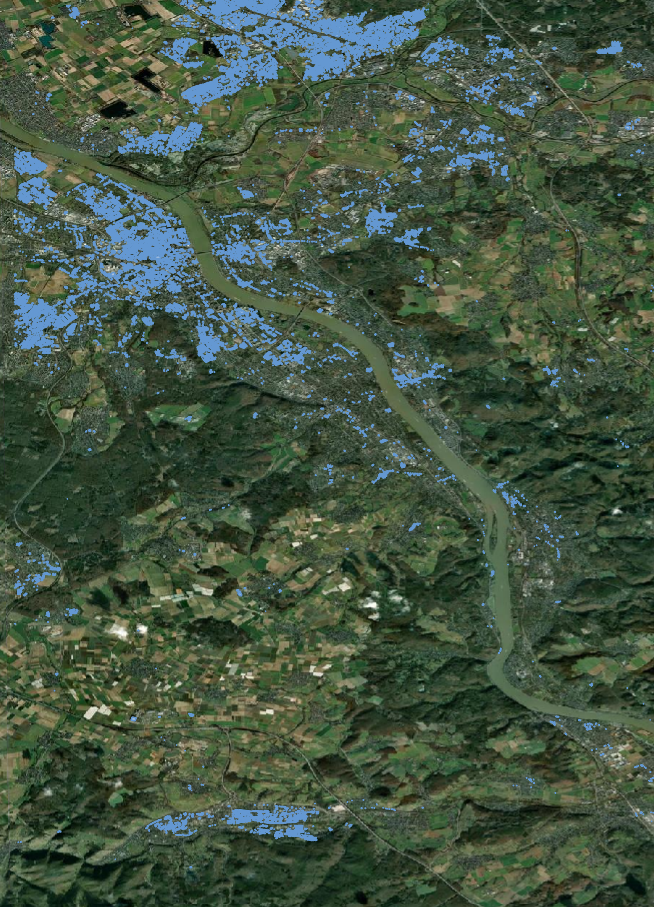



For the roof material dataset, we queried 19364 buildings. For the purposes of the sample, we select a much smaller area, which is why you see the 543 number. Next, we convert the queried OSM data into a usable GeoJSON format. 

In [4]:
def create_building_material_gdf(buildings):
    """
    Creates a GeoDataFrame from a list of building data, standardizes roof material labels,
    filters out rare categories, and saves the data as GeoJSON files.

    Args:
        buildings (list[dict[str, int | str | list[tuple[float, float]]]]): A list of dictionaries representing buildings,
            each containing:
            - "id" (int): The OSM way ID.
            - "roof_material" (str): The type of roof material.
            - "geometry" (list[tuple[float, float]]): List of (longitude, latitude) tuples.

    Returns:
        gpd.GeoDataFrame: Filtered GeoDataFrame containing buildings with more common roof materials.
    """
    geometries = [Polygon(building["geometry"]) for building in buildings]
    roof_materials = [building["roof_material"] for building in buildings]

    gdf = gpd.GeoDataFrame({"roof_material": roof_materials}, geometry=geometries)
    gdf.set_crs(epsg=4326, inplace=True)

    # filter roof categories to ensure 
    category_counts = gdf["roof_material"].value_counts()
    keep_materials = category_counts[category_counts > 10].index.tolist()
    gdf_filtered = gdf[gdf['roof_material'].isin(keep_materials)]

    output_file = "sample_buildings.geojson"
    gdf.to_file(output_file, driver="GeoJSON")

    output_file_filtered = "sample_buildings_filtered.geojson"
    gdf_filtered.to_file(output_file_filtered, driver="GeoJSON")
    return gdf_filtered

gdf_filtered = create_building_material_gdf(buildings_material)
print(gdf_filtered['roof_material'].value_counts())


roof_material
roof_tiles    435
tar_paper     102
Name: count, dtype: int64


Note that the sample dataset is extremely unbalanced and does not include the other 4 notable roof classes. After saving the queried OpenStreetMap data to a GeoJSON, we manually aligned the data and fixed incorrect labels in QGIS. For the purpose of the sample dataset demonstration, we will use the GeoJSON that was just generated.

Because the buildings are offset by a certain amount from the satellite imagery we align the vector geometries to the satellite imagery in QGIS. 
##### Misaligned labels
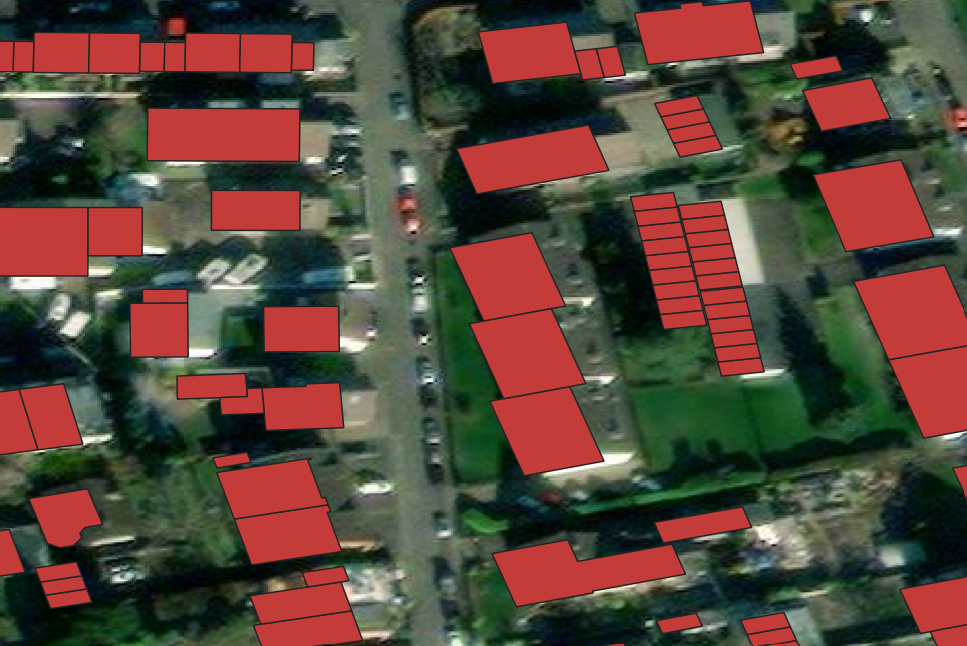

##### Aligned
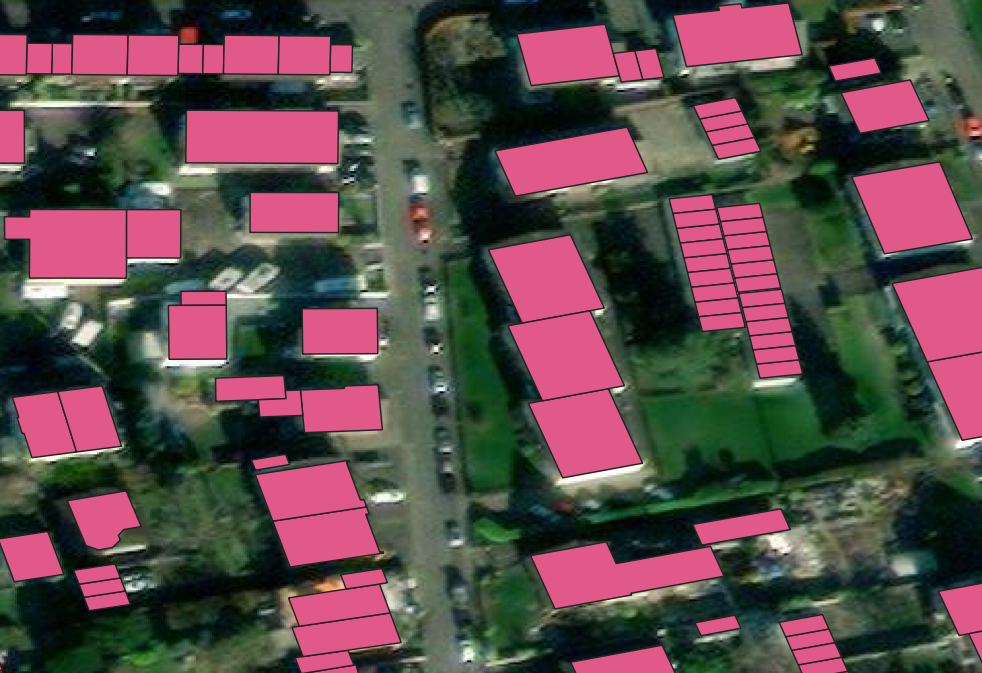

This is imperfect, as buildings vary in height, and thus will be misaligned by different amounts--however, as there are very few excessively tall buildings in the study area, this effect is quite negligible.

NAs of writing this, OSMnx 2.0 seems to be a promising option for automating the creation of a GeoDataFrame of OSM features. They provide other options to define the area from which to gather data than providing a bounding box, such as a geocodable place name or polygon (which may align better with satellite imagery). Find their documentation [here](https://osmnx.readthedocs.io/en/stable/user-reference.html#osmnx.features.features_from_polygon). As an example, here is the code to get every single OSM building footprint in the bounding box using OSMnx. We later use this data to decide which patches to include, as we can now see what percentage of buildings within a patch have a label.

In [18]:
import osmnx as ox
bbox = (7.09837786378, 50.8528358718, 7.1090734608, 50.8568310836) # west, south, east, north
# define the tag(s)—here we want all buildings
tags = {"building": True}

b_gdf = ox.features_from_bbox(bbox=bbox, tags=tags)

# filter just Polygon or MultiPolygon geometries (buildings)
b_gdf = b_gdf[b_gdf.geometry.type.isin(["Polygon", "MultiPolygon"])]
b_gdf.reset_index(drop=True, inplace=True)
b_gdf = b_gdf[['geometry']] # drop all other columns

b_gdf.head()

,geometry
0,"POLYGON ((7.10149 50.85685, 7.10162 50.85686, ..."
1,"POLYGON ((7.10192 50.85591, 7.10191 50.85593, ..."
2,"POLYGON ((7.10237 50.85622, 7.10237 50.85634, ..."
3,"POLYGON ((7.09918 50.85654, 7.09936 50.85655, ..."
4,"POLYGON ((7.1026 50.85625, 7.1026 50.85635, 7...."


#### Step 2: Data Preprocessing and Formatting
In this step, we present a general Python module to create a training dataset in the [Ultralytics YOLO instance segementation dataset format](https://docs.ultralytics.com/datasets/segment/) from geospatial data, saved to the notebook's directory. This involves slicing the input raster image into overlapping patches and generating corresponding label files based on the roof material polygons from the GeoJSON. Each patch is filtered to ensure it contains a minimum number of labeled buildings. For valid patches, the building footprints are clipped, normalized, and saved in YOLO segmentation format. The dataset is then automatically split into training, validation, and test sets, and saved in a structured format. A YAML configuration file is also created to define the dataset structure and class labels for use during model training.

We provide the option to input a GeoJSON of all OSM buildings (regardless of whether they have a roof:shape or roof:material tag) to better filter patches--instead of taking a flat value of minimum labels per patch, patches are valid if more than a certain percentage of the buildings in them have a label. The code to generate a GeoJSON of all buildings in the bounding box is provided in the code block right above.

We used this class to create both roof material and roof shape/geometry datasets.

In [21]:
class RoofMaterialDatasetConverter:
    """
    Converts geospatial roof material annotations and aerial imagery into a YOLO-compatible
    instance segmentation dataset.

    This class handles patch extraction from a raster image, filters for regions with
    sufficient labeled data, clips roof polygons to patch boundaries, and normalizes them
    into the YOLO format. It also supports automatic train/validation/test splitting
    and exports the full dataset in the appropriate directory structure.

    Attributes:
        geojson_path (str): Path to the GeoJSON file containing labeled roof material polygons.
        raster_path (str): Path to the aerial imagery raster file.
        output_dir (str): Directory to save the generated dataset.
        patch_size (int): Height and width (in pixels) of square image patches.
        overlap (int): Number of pixels patches should overlap during extraction.
        patch_min_buildings (int): Minimum number of labeled roofs required in a patch (if no full building set provided).
        all_buildings_path (str | None): Optional GeoJSON path for all buildings (used to compute labeling completeness).
        patch_min_pct_labeled (float): Minimum percentage of labeled buildings required per patch if `all_buildings_path` is used.

    Usage:
        converter = RoofMaterialDatasetConverter(...)
        converter.generate_patches()
        converter.create_dataset_yaml()

    Raises:
        AssertionError: If CRS (coordinate reference systems) between data sources do not match.
    """
    def __init__(self, 
                 geojson_path: str, 
                 raster_path: str, 
                 output_dir: str, 
                 patch_size: int = 384, 
                 overlap: int = 96,
                 patch_min_buildings: int = 3,
                 all_buildings_path: str | None = None,
                 patch_min_pct_labeled: float = 0.5) -> None:

        self.gdf = gpd.read_file(geojson_path)
        self.raster = rasterio.open(raster_path)
        if all_buildings_path:
            self.all_buildings = gpd.read_file(all_buildings_path)
            assert self.gdf.crs == self.all_buildings.crs == self.raster.crs
        else:
            self.all_buildings = None
            assert self.gdf.crs == self.raster.crs

        
        self.output_dir = output_dir
        
        for split in ['train', 'val', 'test']:
            os.makedirs(os.path.join(output_dir, 'images', split), exist_ok=True)
            os.makedirs(os.path.join(output_dir, 'labels', split), exist_ok=True)
        
        self.patch_size = patch_size
        self.overlap = overlap
        self.patch_min_buildings = patch_min_buildings
        self.patch_min_pct_labeled = patch_min_pct_labeled

        # self.class_mapping = {
        #     'gabled': 0,
        #     'flat': 1,
        #     'hipped': 2,
        #     'skillion': 3,
        #     'gambrel': 4,
        #     'half-hipped': 5,
        #     'pyramidal': 6,
        #     'mansard': 7
        # }
        self.class_mapping = {
            'roof_tiles': 0,
            'tar_paper': 1,
            'metal': 2,
            'concrete': 3,
            'tile': 4,
            'gravel': 5,
            'glass': 6
        }

    def generate_patches(self, 
                     train_ratio: float = 0.7, 
                     val_ratio: float = 0.15, 
                     random_state: int = 42) -> dict[str, list[tuple[str, str]]]:
        """
        Generate image patches with corresponding roof material labels.
        
        Returns:
            list of tuples: [(image_path, label_path), ...]
        """
        rng = np.random.default_rng(random_state)

        # collect all potential patches
        all_patches: list[tuple[str, str]] = []
        
        height, width = self.raster.height, self.raster.width
        for y in range(0, height, self.patch_size - self.overlap):
            for x in range(0, width, self.patch_size - self.overlap):
                window = Window(x, y, self.patch_size, self.patch_size)
                
                # read patch from raster
                try:
                    patch = self.raster.read(window=window)
                    patch = np.transpose(patch[:3], (1, 2, 0))  # transpose to HWC
                except Exception as e:
                    print(f"Skipping patch at ({x},{y}) due to error: {e}")
                    continue
                
                # check if patch contains any roof material labels
                patch_bounds = box(
                    self.raster.xy(y, x)[0], 
                    self.raster.xy(y, x)[1],
                    self.raster.xy(y + self.patch_size, x + self.patch_size)[0],
                    self.raster.xy(y + self.patch_size, x + self.patch_size)[1]
                )
                
                # filter roof polygons within this patch
                patch_roofs = self.gdf[self.gdf.intersects(patch_bounds)]
                if self.all_buildings:
                    patch_all_buildings = self.all_buildings[self.all_buildings.intersects(patch_bounds)]
                    if len(patch_roofs) >= len(patch_all_buildings) * self.patch_min_pct_labeled:
                        label_content = self._generate_labels(patch_roofs, patch_bounds)
                        if label_content:
                            all_patches.append((patch, (y, x), label_content))                     
                else:
                    if len(patch_roofs) >= self.patch_min_buildings:
                        label_content = self._generate_labels(patch_roofs, patch_bounds)
                        if label_content:
                            all_patches.append((patch, (y, x), label_content))
        
        # randomly split patches
        n_patches = len(all_patches)
        train_size = int(n_patches * train_ratio)
        val_size = int(n_patches * val_ratio)
        
        rng.shuffle(all_patches)
        
        train_patches = all_patches[:train_size]
        val_patches = all_patches[train_size:train_size+val_size]
        test_patches = all_patches[train_size+val_size:]
        
        split_paths = {
            'train': [],
            'val': [],
            'test': []
        }
        
        for split, patches in [('train', train_patches), ('val', val_patches), ('test', test_patches)]:
            for patch, (y, x), label_content in patches:
                patch_filename = f'patch_{y}_{x}.png'
                
                img_path = os.path.join(self.output_dir, 'images', split, patch_filename)
                label_path = os.path.join(self.output_dir, 'labels', split, patch_filename.replace('.png', '.txt'))
                
                os.makedirs(os.path.dirname(img_path), exist_ok=True)
                os.makedirs(os.path.dirname(label_path), exist_ok=True)
                
                cv2.imwrite(img_path, cv2.cvtColor(patch, cv2.COLOR_RGB2BGR))
                
                with open(label_path, 'w') as f:
                    f.write('\n'.join(label_content))
                split_paths[split].append((img_path, label_path))
        
        return split_paths

    def _generate_labels(self, 
                         roof_polygons: gpd.GeoDataFrame,
                         patch_bounds: box) -> list[str]:
        """
        Generate YOLO segmentation labels for roof polygons in a patch.
        
        Parameters:
            roof_polygons : GeoDataFrame
                GeoDataFrame of roof polygons in the current patch
            patch_bounds : shapely.geometry.box
                Bounding box of the current patch
        
        Returns:
            list of label strings
        """
        labels: list[str] = []
        
        for _, roof in roof_polygons.iterrows():
            # only include specified roof material classes
            class_name = roof['roof_material']
            if class_name not in self.class_mapping:
                continue
            class_index = self.class_mapping[class_name]
            
            # clip polygon to patch bounds
            clipped_roof = roof.geometry.intersection(patch_bounds)
            
            if not clipped_roof.is_empty:
                try:
                    coords = np.array(clipped_roof.exterior.coords)
                    normalized_coords = self._normalize_coordinates(coords, patch_bounds)
                    
                    if len(normalized_coords) >= 3:
                        # create label string: class_index x1 y1 x2 y2 ...
                        label = f"{class_index} " + " ".join(map(str, normalized_coords.flatten()))
                        labels.append(label)
                except Exception as e:
                    print(f"Error processing roof polygon: {e}")
        
        return labels
    
    def _normalize_coordinates(self, 
                               coords: np.ndarray, 
                               patch_bounds: box) -> np.ndarray:
        """
        Normalize polygon coordinates to 0-1 range within patch.
        
        Parameters:
            coords: numpy.ndarray
                Original polygon coordinates
            patch_bounds : shapely.geometry.box
                Bounding box of the current patch
        
        Returns:
            numpy.ndarray of normalized coordinates
        """
        x_min, y_min = patch_bounds.bounds[0], patch_bounds.bounds[1]
        x_max, y_max = patch_bounds.bounds[2], patch_bounds.bounds[3]
        normalized_coords = coords.copy()
        normalized_coords[:, 0] = (coords[:, 0] - x_min) / (x_max - x_min)
        #normalized_coords[:, 1] = (coords[:, 1] - y_min) / (y_max - y_min)
        normalized_coords[:, 1] = (y_max - coords[:, 1]) / (y_max - y_min)

        return normalized_coords
    
    def create_dataset_yaml(self) -> str:
        """
        Create YOLO dataset configuration YAML file.
        
        Returns:
            str: Path to the created YAML file
        """
        # reverse order for right YAML formatting
        class_names = {v: k for k, v in self.class_mapping.items()}
        
        yaml_content = {
            'path': os.path.basename(self.output_dir),
            'train': 'images/train',
            'val': 'images/val',
            'test': 'images/test',
            'names': class_names
        }
        
        yaml_path = os.path.join(self.output_dir, 'roof_materials.yaml')
        with open(yaml_path, 'w') as f:
            yaml.dump(yaml_content, f, default_flow_style=False)
        
        return yaml_path


In [23]:
geojson_path = 'sample_buildings.geojson'
raster_path = 'clipped_bonn_raster.tif' # for the purposes of the sample, we use a clipped raster corresponding to the sample area
output_dir = 'datasets/sample_dataset'

converter = RoofMaterialDatasetConverter(
    geojson_path, 
    raster_path, 
    output_dir,
    patch_min_buildings=3
)

dataset_splits = converter.generate_patches(
    train_ratio=0.7,
    val_ratio=0.15,
    random_state=42
)

yaml_path = converter.create_dataset_yaml()

print(f"YOLO dataset created at {output_dir}")
print(f"Train patches: {len(dataset_splits['train'])}")
print(f"Validation patches: {len(dataset_splits['val'])}")
print(f"Test patches: {len(dataset_splits['test'])}")
print(f"Dataset YAML created at {yaml_path}")


Error processing roof polygon: 'MultiPolygon' object has no attribute 'exterior'
Error processing roof polygon: 'MultiPolygon' object has no attribute 'exterior'
YOLO dataset created at datasets/sample_dataset
Train patches: 25
Validation patches: 5
Test patches: 6
Dataset YAML created at datasets/sample_dataset/roof_materials.yaml


In the actual roof shape training dataset, there are 1535 training patches (2221 in the augmented version), 329 validation patches, and 331 test patches.
In the actual roof material training dataset, there are 520 training patches, 111 validation patches, and 113 test patches. 

#### Dataset improvement techniques 
Based on initial results, it seems that our dataset quality isn't too high--here are some strategies we tried to improve it. The main issues are that the dataset suffers from extreme class imbalance and that the OSM labels are somewhat sparse.
- To deal with the latter, we only keep patches where 70% of the buildings in the patch have a label. This is to reduce the amount of false negatives in the training data. We found that this increased recall by 4.53%, and greatly decreased the amount of false negatives in predictions.
- We also try oversampling patches with a higher representation of underrepresented classes by applying image augmentations using the albumentations library. We found that this had a negligible effect on validation metrics and predictions, though maybe trying different augmentations and increasing the number of augmented images would help. We provide the code to do this augmentation below.

With more time, we would expand the dataset by incorporating nearby areas, perhaps combine rare classes, or incorporate synthetic data/previous high-confidence model predictions.

In [27]:
def augment_rare_classes(
    dataset_root: str,
    rare_class_names: list[str],
    threshold: float = 0.15,
    copies_each: int = 3,
    seed: int = 42,
    img_suffixes=(".png", ".jpg", ".jpeg),
) -> None:
    """
    Target‑ed oversampling. Walks through images/labels under
       <dataset_root>/{images,labels}/train
    Creates N (`copies_each`) augmented variants of every patch whose
    proportion of *rare* class instances ≥ `threshold`.
    Writes new files alongside originals with *_aug{k} suffix.
    """
    random.seed(seed)
    np.random.seed(seed)
    dataset_root = Path(dataset_root)
    imgdir = dataset_root / "images" / "train"
    labdir = dataset_root / "labels" / "train"
    
    # class‑name <-> id map
    with open(dataset_root / "roof_materials.yaml", "r") as f:
        class_names = yaml.safe_load(f)["names"]
    name2id = {name: int(idx) for idx, name in class_names.items()}
    rare_ids = {name2id[n] for n in rare_class_names}

    # define augmentations to apply--we suggest experimenting with different augmentations
    transforms = [
        A.HorizontalFlip(p=0.75),
        A.VerticalFlip(p=0.75),
        A.RandomRotate90(p=0.75),
        A.RandomBrightnessContrast(brightness_limit=0.10, contrast_limit=0.10, p=0.4),
    ]
    
    def _read_polygons(txt_path):
        polys, cls_ids = [], []
        with open(txt_path, "r") as f:
            for line in f:
                parts = list(map(float, line.split()))
                cls_ids.append(int(parts[0]))
                verts = parts[1:]
                polys.append([[verts[i], verts[i + 1]]
                              for i in range(0, len(verts), 2)])
        return polys, cls_ids
    
    def _write_polygons(txt_path, polys, cls_ids):
        with open(txt_path, "w") as f:
            for c, poly in zip(cls_ids, polys):
                flat = list(itertools.chain.from_iterable(poly))
                f.write(" ".join([str(c)] +
                                 [f"{v:.6f}" for v in flat]) + "\n")
    
    # convert normalized polygon to absolute coordinates
    def _normalize_to_absolute(poly, width, height):
        return [[p[0] * width, p[1] * height] for p in poly]
    
    # convert absolute polygon back to normalized coordinates
    def _absolute_to_normalize(poly, width, height):
        return [[p[0] / width, p[1] / height] for p in poly]
    
    txt_files = sorted(labdir.glob("*.txt"))
    total_aug = 0
    
    for lab_path in txt_files:
        polys, cls_ids = _read_polygons(lab_path)
        if not polys:
            continue
        
        frac_rare = sum(cls in rare_ids for cls in cls_ids) / len(cls_ids)
        if frac_rare < threshold:
            continue
        
        img_path = None
        for suff in img_suffixes:
            candidate = imgdir / f"{lab_path.stem}{suff}"
            if candidate.exists():
                img_path = candidate
                break
        
        if img_path is None:
            print(f"[warn] image not found for {lab_path.stem}")
            continue
        
        img = cv2.imread(str(img_path))
        h, w = img.shape[:2]
        
        abs_polys = [_normalize_to_absolute(poly, w, h) for poly in polys]
        
        for k in range(copies_each):
            # create a composed transform for this specific augmentation
            aug = A.Compose(
                random.sample(transforms, k=random.randint(1, len(transforms))),
                keypoint_params=A.KeypointParams(format='xy', remove_invisible=False)
            )
            
            # convert polygons to keypoints list for transformation
            all_keypoints = []
            keypoint_ids = []
            
            for i, poly in enumerate(abs_polys):
                for point in poly:
                    all_keypoints.append((point[0], point[1]))
                    keypoint_ids.append(i)
            
            try:
                transformed = aug(image=img, keypoints=all_keypoints)
                aug_img = transformed["image"]
                aug_keypoints = transformed["keypoints"]
                
                h_new, w_new = aug_img.shape[:2]
                
                # group keypoints back into polygons
                transformed_polys = [[] for _ in range(len(abs_polys))]
                for (x, y), poly_id in zip(aug_keypoints, keypoint_ids):
                    transformed_polys[poly_id].append([x, y])
                
                norm_transformed_polys = [_absolute_to_normalize(poly, w_new, h_new) 
                                         for poly in transformed_polys]
                
                stub = f"{lab_path.stem}_aug{k}"
                new_img = img_path.with_name(stub + img_path.suffix)
                new_lab = lab_path.with_name(stub + ".txt")
                cv2.imwrite(str(new_img), aug_img)
                _write_polygons(new_lab, norm_transformed_polys, cls_ids)
                
                total_aug += 1
            except Exception as e:
                print(f"Error processing {lab_path.stem}: {e}")
    
    print(f"Finished. Added {total_aug} augmented images.")

In [28]:
sample_dataset_path = "datasets/sample_dataset/"

# rare_shape_classes = ["hipped", "skillion", "pyramidal", "mansard", "half-hipped", "gambrel"]
rare_material_classes = ["metal", "concrete", "tile", "gravel", "glass"]

# augment (creates copies_each new images per qualifying patch)
augment_rare_classes(
    dataset_root=sample_dataset_path,
    rare_class_names=rare_material_classes,
    threshold=0.15,      # if greater than 15% of the buildings in the patch are of a rare class, it qualifies
    copies_each=3
)

Finished. Added 0 augmented images.


The dataset is structured as follows:
dataset/
├── images/
│   ├── train/
│   ├── val/
│   └── test/
├── labels/
│   ├── train/
│   ├── val/
│   └── test/
└── roof_shapes.yaml

- Images are stored as `.png` tiles.
- Labels are text files in YOLO instance segmentation format:  
  `<class_index> x1 y1 x2 y2 ... xn yn>`

For the roof material dataset, the classes and class IDs are:
    'roof_tiles': 0,
    'tar_paper': 1,
    'metal': 2,
    'concrete': 3,
    'tile': 4,
    'gravel': 5,
    'glass': 6
Descriptions of these classes can be found at the [OSM Wiki](https://wiki.openstreetmap.org/wiki/Key:roof:material)

For the roof shape/geometry dataset, the classes are:
    'gabled': 0,
    'flat': 1,
    'hipped': 2,
    'skillion': 3,
    'gambrel': 4,
    'half-hipped': 5,
    'pyramidal': 6,
    'mansard': 7
Descriptions of these classes can be found at the [OSM Wiki](https://wiki.openstreetmap.org/wiki/Key:roof:shape)


These annotations are drawn from OpenStreetMap tags and validated to ensure accurate material segmentation.

To sum up, the pipeline:
- Extracts overlapping patches of size `384×384 px` with `96 px` overlap.
- Filters to retain patches with at least 3 labeled buildings or >70% of known buildings labeled.
- Clips roof polygons to patch bounds and normalizes coordinates.
- Saves results in YOLO instance segmentation format.

This dataset focuses on urban and peri-urban areas in **Bonn, Germany**. The geographic extent of the full dataset is (50.47044, 7.04552), (50.917936, 7.271421), bottom-left corner and top-right corner.


#### Data Visualization
Here are some examples of what individual images and labels look like:
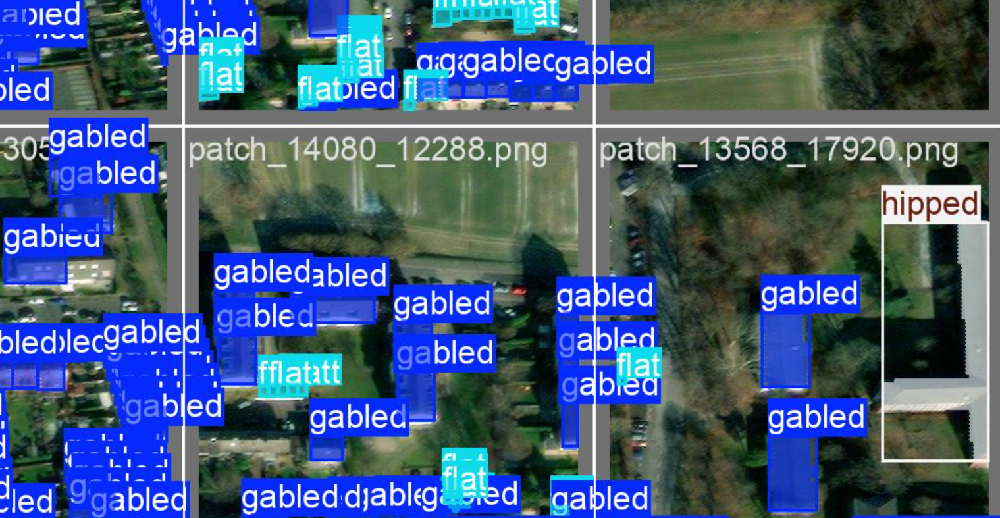
The YOLOv11 Model applies image augmentations, such as patching multiple images together and a Gaussian blur, when the training dataset is fed into the model:
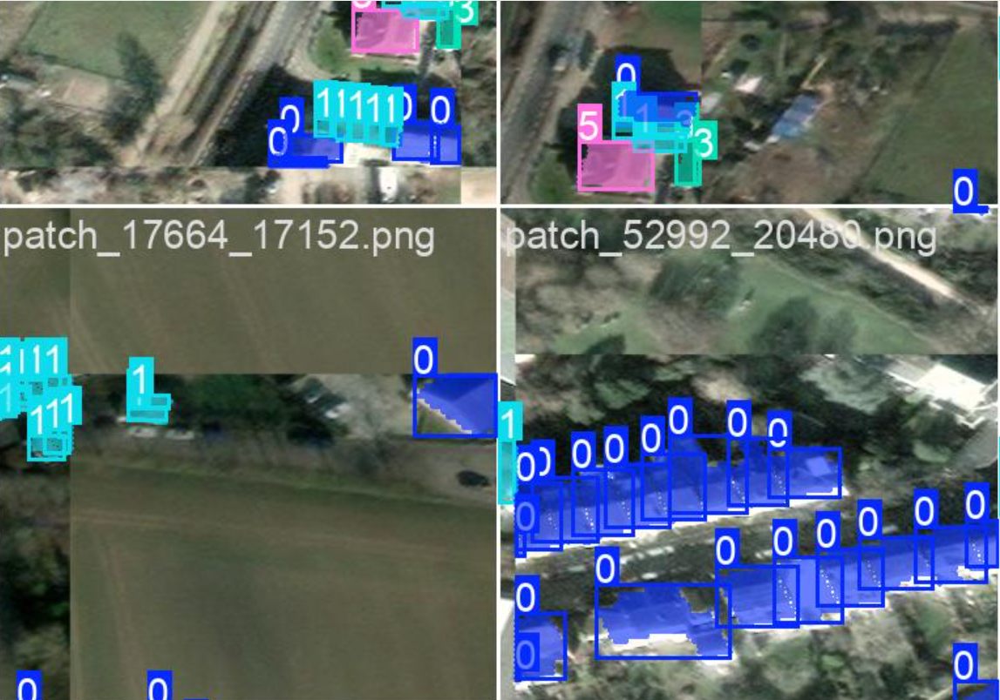

#### Step 3: Model Training
In this step, we fine-tune the pre-trained [Ultralytics YOLOv11](https://docs.ultralytics.com/models/yolo11/) instance segmentation model on our curated roof material dataset.

YOLOv11 supports instance segmentation natively, allowing the model to learn both **which type of roof material is present** and **where it appears** in the image. By leveraging a model pre-trained on large-scale visual datasets, we benefit from transfer learning: the network has already learned general visual patterns (e.g., edges, shapes, textures), and we now adapt it to the specific task of **roof material classification from aerial imagery**.

The training process involves:

- Specifying the `roof_materials.yaml` file, which defines paths to training/validation/test sets and maps class indices to material names.
- Loading the pre-trained weights (e.g., `yolo11s-seg.pt`) as a starting point.
- Running the model over several epochs while monitoring training and validation metrics (loss, segmentation mAP, etc.).

We use Ultralytics' Python interface to launch training, configure hyperparameters, and log progress. The actual training runs for up to 100 epochs. The model uses 640x640 images (or any multiple of 16 for the patch size), a batch size of 16, and leverages a GPU (device='0'). Training plots are enabled for visualizing performance metrics. Actual model results will be attached--the current hyperparameters are much lower for the purposes of being runnable as a sample.

Model citation:
@software{yolo11_ultralytics,
  author = {Glenn Jocher and Jing Qiu},
  title = {Ultralytics YOLO11},
  version = {11.0.0},
  year = {2024},
  url = {https://github.com/ultralytics/ultralytics},
  orcid = {0000-0001-5950-6979, 0000-0002-7603-6750, 0000-0003-3783-7069},
  license = {AGPL-3.0}
}


In [29]:
model = YOLO('yolo11n-seg.pt')

# lower training run hyperparameters for sample purposes
results = model.train(
    data="datasets/sample_dataset/roof_materials.yaml",
    epochs=10,
    imgsz=640,
    batch=1,
    plots=True,
    device='cpu',
    pretrained=True,
    patience=5,
    save_period=1
)

New https://pypi.org/project/ultralytics/8.3.111 available 😃 Update with 'pip install -U ultralytics'
Ultralytics 8.3.100 🚀 Python-3.12.3 torch-2.6.0+cu124 CPU (AMD EPYC-Milan Processor)
engine/trainer: task=segment, mode=train, model=yolo11n-seg.pt, data=datasets/sample_dataset/roof_materials.yaml, epochs=10, time=None, patience=5, batch=1, imgsz=640, save=True, save_period=1, cache=False, device=cpu, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, sho

train: Scanning /home/ubuntu/roofmap_project/datasets/sample_dataset/labels/train... 25 images, 0 backgrounds, 0 corrupt

train: New cache created: /home/ubuntu/roofmap_project/datasets/sample_dataset/labels/train.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))



val: Scanning /home/ubuntu/roofmap_project/datasets/sample_dataset/labels/val... 5 images, 0 backgrounds, 0 corrupt: 100

val: New cache created: /home/ubuntu/roofmap_project/datasets/sample_dataset/labels/val.cache


Plotting labels to /home/ubuntu/roofmap_project/runs/segment/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000909, momentum=0.9) with parameter groups 90 weight(decay=0.0), 101 weight(decay=0.0005), 100 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 0 dataloader workers
Logging results to /home/ubuntu/roofmap_project/runs/segment/train
Starting training for 10 epochs...
Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       1/10         0G      4.054      5.254      4.983      2.878          7        640: 100%|██████████| 25/25 [00:14<
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP5

                   all          5        153   0.000924     0.0051   0.000473   0.000142          0          0          0          0



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       2/10         0G      3.837      4.744      4.922      2.818         39        640: 100%|██████████| 25/25 [00:13<
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP5

                   all          5        153   0.000924     0.0051   0.000473   0.000142          0          0          0          0



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       3/10         0G      3.592      4.328      4.859      2.602         46        640: 100%|██████████| 25/25 [00:13<
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP5

                   all          5        153     0.0012     0.0051   0.000609   6.09e-05          0          0          0          0



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       4/10         0G      3.727      4.475      4.825      2.501         21        640: 100%|██████████| 25/25 [00:11<
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP5

                   all          5        153     0.0012     0.0051   0.000609   6.09e-05          0          0          0          0



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       5/10         0G      3.579      4.603      4.813      2.513         30        640: 100%|██████████| 25/25 [00:09<
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP5

                   all          5        153    0.00475     0.0153    0.00247   0.000983    0.00316     0.0102    0.00162   0.000405



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       6/10         0G      3.485      3.816      4.805      2.396         23        640: 100%|██████████| 25/25 [00:11<
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP5

                   all          5        153    0.00475     0.0153    0.00247   0.000983    0.00316     0.0102    0.00162   0.000405



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       7/10         0G      3.376      3.817       4.87      2.279         17        640: 100%|██████████| 25/25 [00:12<
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP5

                   all          5        153    0.00475     0.0153    0.00247   0.000983    0.00316     0.0102    0.00162   0.000405



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       8/10         0G      3.539      4.029      4.895      2.163         33        640: 100%|██████████| 25/25 [00:10<
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP5

                   all          5        153     0.0053     0.0153    0.00296   0.000776     0.0053     0.0153    0.00274   0.000459



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       9/10         0G      3.427      3.979      4.669      2.261         18        640: 100%|██████████| 25/25 [00:09<
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP5

                   all          5        153     0.0053     0.0153    0.00296   0.000776     0.0053     0.0153    0.00274   0.000459



      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      10/10         0G      3.384      3.983      4.608      2.258         10        640: 100%|██████████| 25/25 [00:13<
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP5

                   all          5        153     0.0053     0.0153    0.00296   0.000776     0.0053     0.0153    0.00274   0.000459



10 epochs completed in 0.038 hours.
Optimizer stripped from /home/ubuntu/roofmap_project/runs/segment/train/weights/last.pt, 6.0MB
Optimizer stripped from /home/ubuntu/roofmap_project/runs/segment/train/weights/best.pt, 6.0MB

Validating /home/ubuntu/roofmap_project/runs/segment/train/weights/best.pt...
Ultralytics 8.3.100 🚀 Python-3.12.3 torch-2.6.0+cu124 CPU (AMD EPYC-Milan Processor)
YOLO11n-seg summary (fused): 113 layers, 2,835,933 parameters, 0 gradients, 10.2 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP5

WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP5

WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...
WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP5

WARNING ⚠️ Limiting validation plots to first 50 items per image for speed...


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP5


                   all          5        153    0.00538     0.0153    0.00301    0.00079    0.00538     0.0153    0.00278   0.000466
            roof_tiles          5         98     0.0108     0.0306    0.00602    0.00158     0.0108     0.0306    0.00555   0.000931
             tar_paper          3         55          0          0          0          0          0          0          0          0
Speed: 0.8ms preprocess, 98.1ms inference, 0.0ms loss, 6.6ms postprocess per image
Results saved to /home/ubuntu/roofmap_project/runs/segment/train


## Results


Our YOLOv11-based roof shape classification model achieved moderate performance metrics on the test dataset. For the bounding box detection task (B), we obtained a precision of 54.67% and recall of 42.25%, with an mAP50 of 42.90%. For the masking/instance segmentation task (M), results were similar with 52.75% precision and 42.16% recall, yielding an mAP50 of 41.29%.
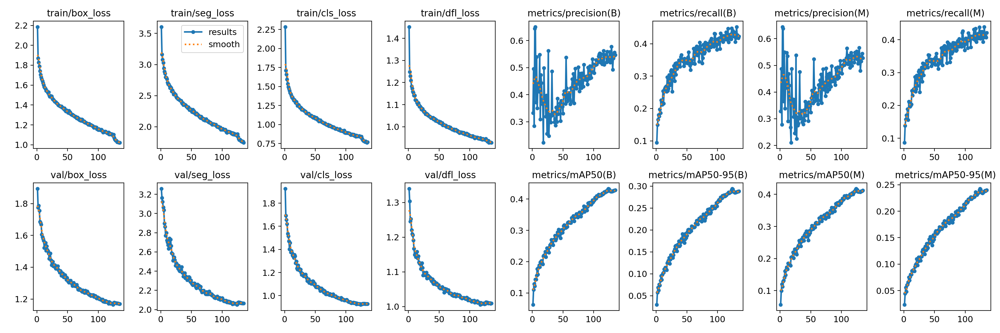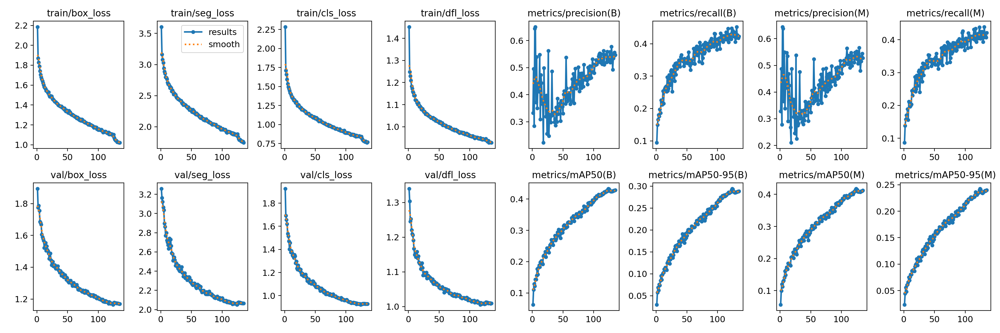

Meanwhile, the roof material classification model achieved a precision of 67.60% for the bounding box detection task and 66.38% for the masking/instance segmentation task.

These metrics highlight the inherent challenges in satellite-based roof material classification. While the model demonstrates some discriminative capability—performing notably better than random chance—there remains substantial room for improvement. The drop in mAP50-95 scores (28.86% for binary and 23.99% for multi-class) indicates challenges with precise localization and classification confidence across varying IoU thresholds.

However, the model predicts 81% of gabled roofs correctly--this is a promising sign that, with enough samples in the training data the model can predict the class fairly well. Note: The percentages below are the proportions of ground truth labels corresponding to a predicted model class, not vice versa. 
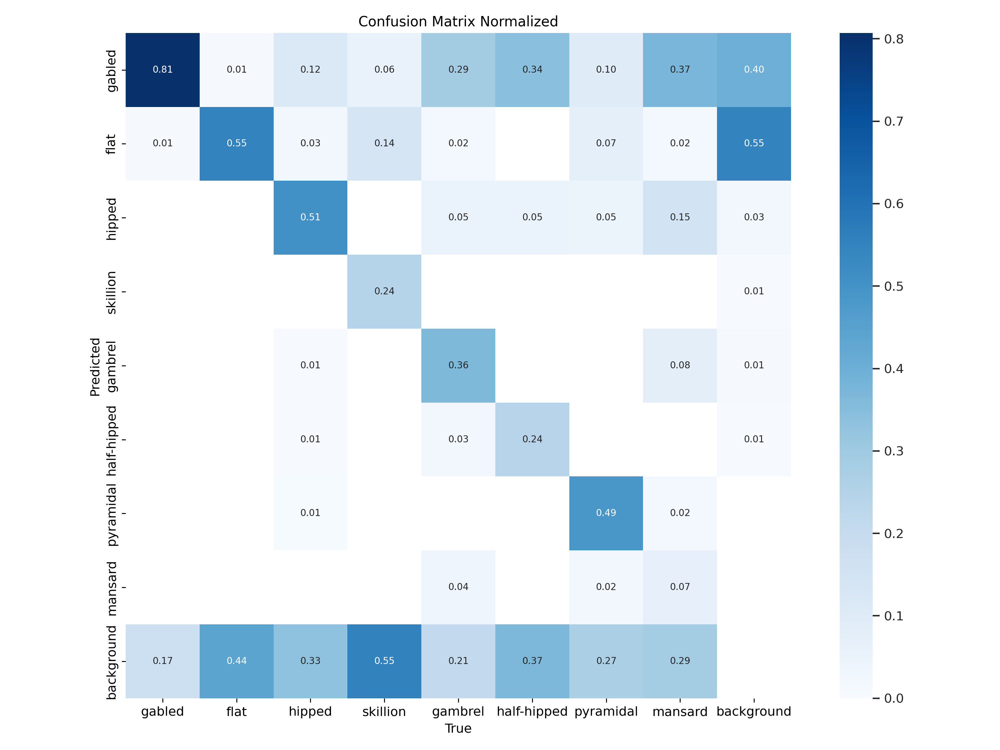

The predictions also exhibit good building segmentation and object detection, showcasing the potential for high-quality OSM data for building segmentation tasks, although this is a less neglected problem area.

### Analysis of Limitations

Several factors likely contributed to these benchmark results:

**Data Quality Challenges**: The reliance on OpenStreetMap labels introduces potential inconsistencies in ground truth annotations, as these labels are community-contributed and may vary in accuracy and specificity.
**Class Imbalance**: Despite our data processing efforts, imbalances in roof material distribution in the dataset likely impacted the model's ability to learn less frequent classes effectively.
**Visual Similarity**: Certain roof materials (e.g., black metal roofing versus tar paper) present inherent visual similarities that challenge classification even with optimal data and model architectures.

Data Pipeline Contributions
While model performance metrics indicate room for improvement, we emphasize that our primary contribution is the creation of a complete, reproducible pipeline for:

Extracting building roof information from OpenStreetMap
Processing high-resolution satellite imagery from open sources
Converting geospatial data into AI-ready training formats
Training and evaluating roof material classification models

This pipeline provides a valuable foundation for the community to build upon, enabling iterative improvements through larger datasets, enhanced model architectures, or domain-specific optimizations.

##### Example ground truth patches
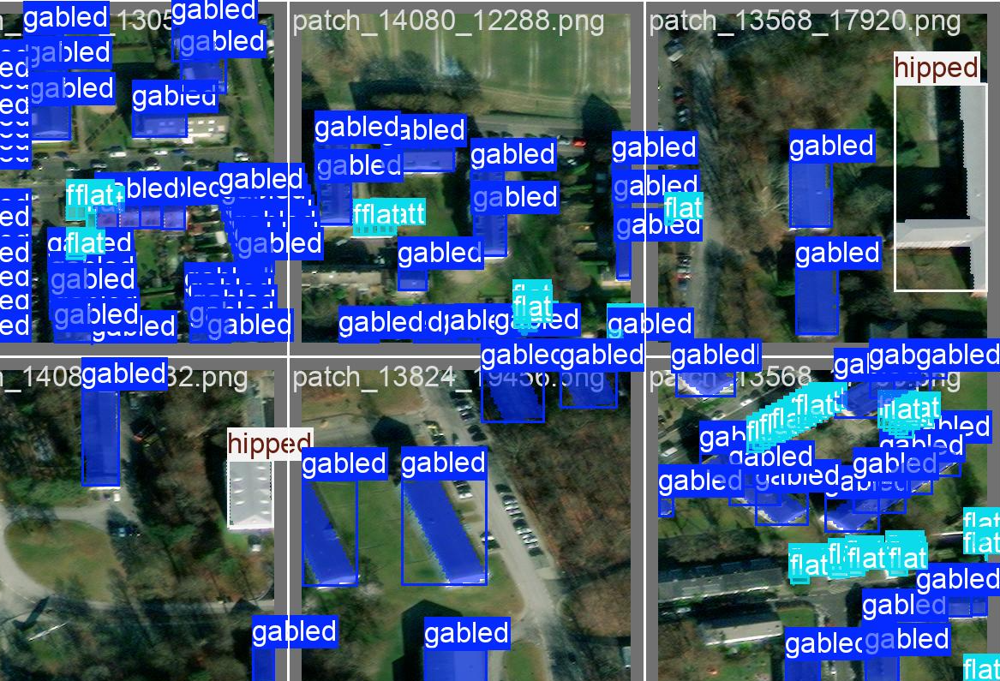

##### Model Predictions:
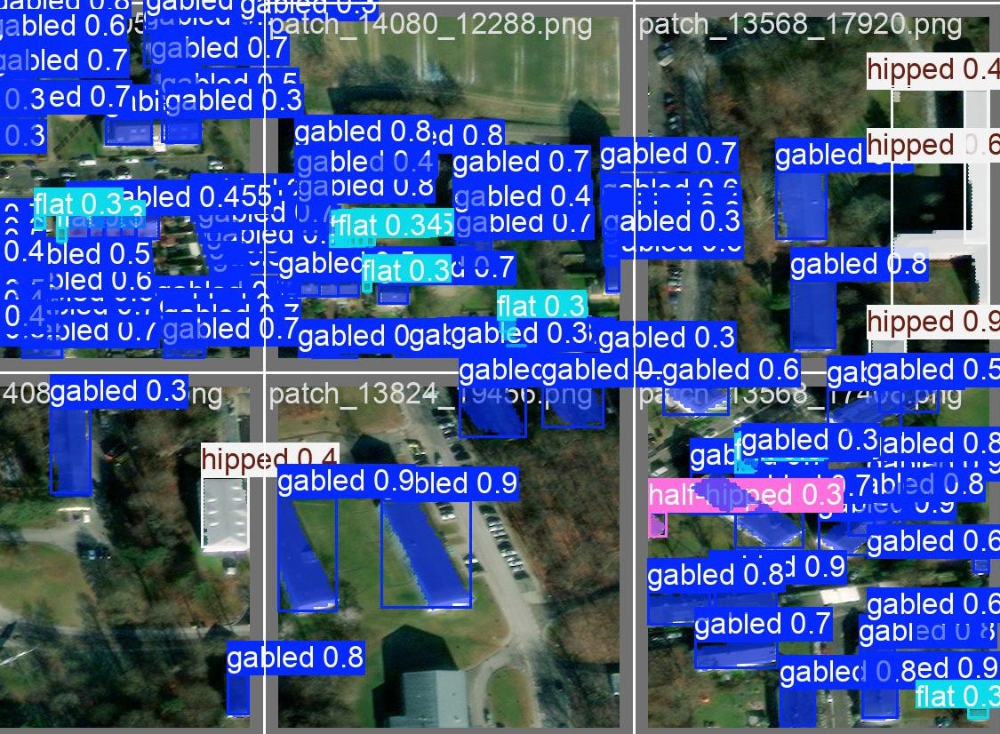

#### Step 4: Model Inference
We apply the model trained on the augmented roof shape dataset for predictions on an image in the test set of the sample dataset. The next step would be to apply this model to a wide swath of area and gain geographic results--however, it would be best to improve model accuracy before doing this. 

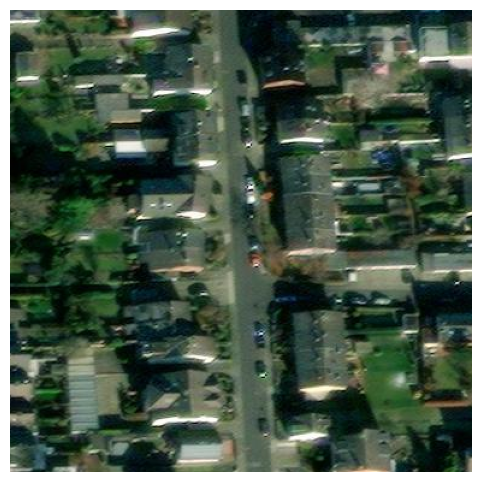

In [36]:
image_path = "datasets/sample_dataset/images/test/patch_288_1152.png"
img = mpimg.imread(image_path)

plt.figure(figsize=(8, 6))
plt.imshow(img)
plt.axis('off')
plt.show()

In [40]:
model = YOLO("best.pt")

results = model("datasets/sample_dataset/images/test/patch_0_2304.png")

# Process results
for result in results:
    boxes = result.boxes  # Bounding boxes
    masks = result.masks  # Segmentation masks
    classes = result.names  # Class names

    result.save(filename="prediction.jpg")


image 1/1 /home/ubuntu/roofmap_project/datasets/sample_dataset/images/test/patch_0_2304.png: 384x384 14 gableds, 22 flats, 1 hipped, 1 skillion, 109.1ms
Speed: 0.8ms preprocess, 109.1ms inference, 11.0ms postprocess per image at shape (1, 3, 384, 384)


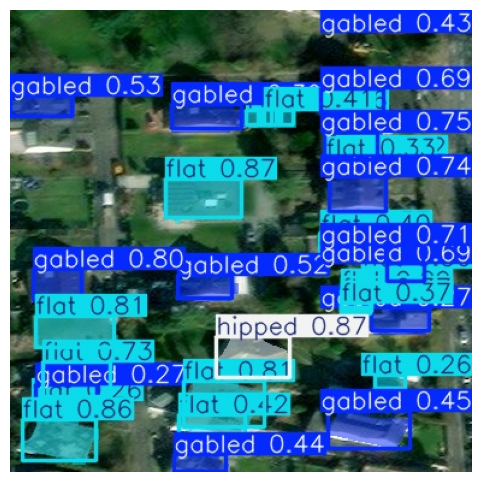

In [41]:
predictions = 'prediction.jpg'
img = mpimg.imread(predictions)

plt.figure(figsize=(8, 6))
plt.imshow(img)
plt.axis('off')  # Turn off axes for a cleaner display
plt.show()

## Conclusion

#### Impact Potential and Real-World Use Cases
The roof geometry and material classification model developed in this notebook offers significant potential to inform and shape real-world policy and decision-making, particularly in areas critical to community safety, infrastructure resilience, and sustainable development. 

##### Informing Disaster Risk Reduction Policies
By accurately identifying [flammable roofing materials](https://ucanr.edu/statewide-program/ucanr-fire-network/roof) such as wood shingles or thatch in wildfire-prone areas, or insecure and vulnerable materials in hurricane-prone areas, the model can directly guide targeted [retrofitting initiatives](https://blogs.worldbank.org/en/sustainablecities/retrofitting-housing-policy-saves-lives), influence building codes, and inform evacuation and risk mitigation strategies. Policymakers could prioritize resources more effectively, enhancing community resilience to natural disasters such as wildfires or hurricanes.

##### Infrastructure Investment and Urban Planning
The insights provided by the model could support targeted infrastructure investments. For instance, municipalities or urban planners could utilize the classification results to identify areas where investment in durable or sustainable roofing materials could significantly reduce long-term maintenance costs, improve thermal efficiency, and mitigate the [urban heat island effect](https://www.epa.gov/heatislands/using-cool-roofs-reduce-heat-islands).

##### Economic and Development Indicators
Roof material data, enriched by the model, could become a valuable socioeconomic indicator, potentially contributing to more accurate subnational GDP estimates or [socioeconomic analyses](https://dl.acm.org/doi/10.1145/3615361). Such enriched datasets would assist policymakers, NGOs, and [international organizations](https://unstats.un.org/unsd/demographic-social/census/documents/tr_on_sdg_in_phc_crvs.pdf) in understanding regional development dynamics.

##### Solar Energy Capacity Prediction
Roof shape or geometry data are valuable for predicting [solar capacity](https://sunroof.withgoogle.com/), and can be combined with building footprint angles and areas to predict both the orientation of roof faces and area available for solar panel placement. This data can also be combined with building height estimates or LIDAR for a more accurate prediction of irregular shadows. Overall, we envision this data to be useful for urban [solar radiation](https://www.sciencedirect.com/science/article/abs/pii/S0960148120302378?via%3Dihub) studies and supporting the energy transition.

##### Global South and Resource-Limited Areas
The developed pipeline, though demonstrated here on data-rich European locations, is inherently scalable and adaptable. Its true potential lies in addressing data gaps in the Global South or regions lacking comprehensive building surveys. Implementing this approach in areas with OSM roof material and shape labels, such as Nepal, Mozambique, Sri Lanka, and India, could significantly enhance disaster preparedness, economic analysis, [infectious disease prevention](https://pmc.ncbi.nlm.nih.gov/articles/PMC11654929/), and infrastructure development efforts, ultimately contributing to more resilient communities and informed resource allocation.



#### Next Steps + Potential Improvements
Our work establishes an initial benchmark in the challenging domain of automated roof material classification. Future work could explore:

- Given more time, we would greatly expand the dataset--while roof material dataset may need to be region-specific, the roof shape dataset could incorporate labels from aroudn the world to create a general roof shape classifier. Given high-resolution satellite imagery and existing OSM labels, the size of this dataset could easily be increased using this pipeline.
- The clearest extension of this study, to improve inference accuracy and make predictions usable, would be to intersect model predictions with OSM building outlines, thereby transforming this problem from an instance segmentation and classification task to just a classification task. I.e., if there is a model prediction that strongly overlaps with an OSM building outline, we can set the roof material/shape label of the OSM building outline, which is likely far more accurate to reality, to the model prediction. This would make the model outputs far more usable as they now correspond to accurate building outlines and can serve as a direct pipeline for contributing more OSM data.
- Establish methods, such as conducting inference on satellite imagery taken at the same location but at different points in time, to track changes in roof material to support dynamic infrastructure management and long-term policy monitoring.
- Incorporating multi-spectral imagery to capture non-visible features that might better differentiate materials.
- Explore how roof material classification can be integrated as a feature for subnational GDP and socioeconomic estimates.
- Enhance dataset quality through experimentation with smaller image patch sizes, targeted data augmentation, and advanced synthetic data generation techniques to address class imbalance. Improving the dataset quality is probably the biggest bottleneck, and might need manual verification of dataset quality.
- Adding other features such as building area, age, or height, if available, may improve model predictions.
- Developing a robust pipeline specifically designed for areas with sparse or dispersed labeling such as Nepal, Mozambique, Sri Lanka, and India, building upon the scalable framework demonstrated in this study.
- Adapt the existing pipeline for medium-to-high resolution satellite imagery (~3m) to broaden its practical applicability in areas where open high-resolution satellite imagery or aerial imagery is not available.
- Perform extensive validation and inference in additional regions, initially within Germany and subsequently in diverse global contexts, to establish broader utility and facilitate widespread adoption.

Although there are current limitations to this pipeline, we believe it holds immense potential. With sufficient training data and future work making model predictions usable, we hope this work will provide value to policymakers and other researchers.

For any inquiries or collaboration, please reach out to the authors:
- Julian Huang, University of Chicago, julianhuang@uchicago.edu
- Yue Lin, University of Chicago, liny2@uchicago.edu
- Alex Monito Nhancololo, University of São Paulo, amnhancololo@gmail.com